# REAL_SECURITY_ANALYSIS_TOOL
    * CREATED BY GORDON DEAN PISCIOTTA

In [2]:
### Data manipulation
import numpy as np
from bs4 import BeautifulSoup as bs
import pandas as pd
import pandas_datareader
from pandas_datareader import data as wb
from pandas.util.testing import assert_frame_equal
### Options for pandas
pd.options.display.max_columns = 50
pd.options.display.max_rows = 30
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
### Cufflinks binds Plotly directly to pandas dataframes.
import cufflinks as cf
cf.go_offline(connected=True)
cf.set_config_file(theme='white')

### Visualizations
import matplotlib.pyplot as plt
%matplotlib inline
### More Visualizations
import chart_studio.plotly as py
import plotly
import plotly.tools as tls
import plotly.graph_objs as go
import plotly.offline as ply
plotly.offline.init_notebook_mode(connected=True)
### More Visualizations
import seaborn as sns
sns.set()
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error
from scipy.optimize import minimize
import statsmodels.tsa.api as smt
import statsmodels.api as sm
from tqdm import tqdm_notebook
from itertools import product

 
### IMPORT API FUNCTIONS
import quandl
import yfinance as yf
from yahoofinancials import YahooFinancials
import requests
import alpha_vantage
from alpha_vantage.timeseries import TimeSeries
import iexfinance
from iexfinance.stocks import Stock
from iexfinance.stocks import get_historical_data
from iexfinance.stocks import get_historical_intraday
from iexfinance.refdata import get_symbols
from iexfinance.data_apis import get_data_points
from iexfinance.data_apis import get_time_series
from iexfinance.altdata import get_social_sentiment
from iexfinance.altdata import get_ceo_compensation

### MISC LIB IMPORTS
import locale
from datetime import date, datetime, timedelta
from nsepy import get_history
from urllib.request import urlopen
import os
import time
import csv
import json
import requests
from patsy import dmatrices
import warnings
warnings.filterwarnings('ignore')
import jupytemplate
#print(jupytemplate.get_template_path())

# Quantitative Value Strategy

In [6]:
########################################################################## LIBRARY IMPORT
import numpy as np
from bs4 import BeautifulSoup as bs
import pandas as pd
import pandas_datareader
from pandas_datareader import data as wb
import requests

##########################################################################
def get_fundamental_data(df):
    for symbol in df.index:

        url = ("http://finviz.com/quote.ashx?t=" + symbol.lower())
        soup = bs(requests.get(url).content)  # , features='html5lib')
        for m in df.columns:
            try:
                df.loc[symbol, m] = fundamental_metric(soup, m)
            except Exception as e:
                print(symbol, 'not found')
                print(e)
                break
    return df

def fundamental_metric(soup, metric):
    return soup.find(text=metric).find_next(class_='snapshot-td2').text

########################################### Define A List Of Stocks And The Fundamental Metrics
#               1      2       3      4     5     6     7     8      9     10 
stock_list = ['AMZN','GOOGL','AAPL','FB','TSLA','WMT','DIS','SHOP','TPL','SIVB',
              'SAGE','AMD', 'NBL', 'AXL', 'DAN','KMX','MSFT','ZM','AVID','AGYS',
              'DRD','FVRR', 'REGN', 'TW', 'TTD','DFS','MOS', 'CF', 'FMC', 'TECK'
             ]

# reserve tickers:
    # 

metric1 = ['Market Cap',
          'Income',
          'Dividend %',
          'P/E',
          'Debt/Eq',
          'EPS (ttm)',
          'ROA',
          'ROE',
          'ROI',
          'Gross Margin',
          'Oper. Margin'
]
          
metric2 = ['Target Price',
          '52W Range',
          'RSI (14)',
          'Perf Month',
          'Perf Half Y',
          'Perf Year',
          'Perf YTD',
          'Beta',
          'Volatility',
          'SMA20',
          'SMA50',
          'SMA200'
]

##########################################################################
df1 = pd.DataFrame(index=stock_list,columns=metric1)
df1 = get_fundamental_data(df1)

print('')
print("All stocks with fundamental data")

df1.to_csv(r'C:/Users/gordon/OneDrive/CODE\4_Data\1_AssetAnalysis\QualatativeAnalysis1.csv')
new_df1=pd.read_csv(r'C:/Users/gordon/OneDrive/CODE\4_Data\1_AssetAnalysis\QualatativeAnalysis1.csv')

##########################################################################

df2 = pd.DataFrame(index=stock_list,columns=metric2)
df2 = get_fundamental_data(df2)

print('')
print("All stocks with fundamental data")
            
df2.to_csv(r'C:/Users/gordon/OneDrive/CODE\4_Data\1_AssetAnalysis\QualatativeAnalysis2.csv')
new_df2=pd.read_csv(r'C:/Users/gordon/OneDrive/CODE\4_Data\1_AssetAnalysis\QualatativeAnalysis2.csv')

##########################################################################

new_df1.columns = ['Tickers',
                 'Market Cap',
                 'Income',
                 'Dividend %',
                 'P/E',
                 'Debt/Eq',
                 'EPS (ttm)',
                 'ROA',
                 'ROE',
                 'ROI',
                 'Gross Margin',
                 'Oper. Margin'
]

new_df2.columns =['Tickers',
                  'Target Price',
                  '52W Range',
                  'RSI (14)',
                  'Perf Month',
                  'Perf Half Y',
                  'Perf Year',
                  'Perf YTD',
                  'Beta',
                  'Volatility',
                  'SMA20',
                  'SMA50',
                  'SMA200']

##########################################################################



All stocks with fundamental data

All stocks with fundamental data


In [7]:
##########################################################################

new_df1.sort_values('Gross Margin', ascending=False, inplace = True) 
new_df2.sort_values('Perf Year', ascending=False, inplace = True) 

##########################################################################
##########################################################################

n_df1=pd.DataFrame()
n_df2=pd.DataFrame()

n_df1=new_df1
n_df2=new_df2

##########################################################################
##########################################################################

new_df1['Rank'] = range(len(stock_list))
new_df1.set_index('Rank', inplace=True)

new_df2['Rank'] = range(len(stock_list))
new_df2.set_index('Rank', inplace=True)

##########################################################################

In [8]:
new_df1.head(30)

,Tickers,Market Cap,Income,Dividend %,P/E,Debt/Eq,EPS (ttm),ROA,ROE,ROI,Gross Margin,Oper. Margin
Rank,,,,,,,,,,,,
0,SAGE,1.97B,-680.20M,-,-,0.00,-13.39,-54.10%,-59.80%,-75.00%,94.20%,-
1,REGN,59.04B,2.12B,-,30.66,0.06,18.47,15.50%,20.70%,16.10%,90.10%,28.10%
2,FB,544.06B,18.49B,-,31.23,0.00,6.09,15.30%,20.00%,17.50%,81.90%,33.90%
3,ZM,44.69B,21.80M,-,1825.29,0.00,0.09,1.90%,2.80%,1.40%,81.50%,2.00%
4,NBL,4.36B,-1512.00M,0.98%,-,0.89,-3.16,-7.10%,-17.00%,-6.40%,80.60%,-30.70%
5,FVRR,1.25B,-34.20M,-,-,0.04,-1.10,-16.30%,-26.60%,-22.50%,79.20%,-32.40%
6,TTD,12.13B,108.30M,-,113.50,0.00,2.26,7.90%,20.90%,17.00%,76.40%,17.00%
7,MSFT,1330.25B,41.72B,1.17%,32.29,0.71,5.41,15.90%,42.90%,19.90%,67.70%,36.70%
8,AVID,301.36M,7.60M,-,46.99,-,0.15,2.60%,-4.50%,46.00%,60.50%,7.10%


In [9]:
new_df2.head(30)

,Tickers,Target Price,52W Range,RSI (14),Perf Month,Perf Half Y,Perf Year,Perf YTD,Beta,Volatility,SMA20,SMA50,SMA200
Rank,,,,,,,,,,,,,
0,REGN,485.17,271.37 - 574.32,65.14,31.74%,85.63%,61.78%,50.80%,0.52,3.72% 4.18%,10.14%,19.54%,55.99%
1,DRD,9.25,1.64 - 9.69,65.66,51.29%,102.59%,386.01%,82.85%,0.64,6.32% 9.49%,28.31%,40.24%,84.28%
2,AAPL,304.56,170.27 - 327.85,55.65,15.25%,16.36%,37.85%,-3.64%,1.19,2.59% 3.22%,6.60%,2.93%,10.60%
3,MSFT,186.52,119.01 - 190.70,56.21,18.81%,27.19%,35.15%,10.68%,0.95,2.65% 3.50%,5.84%,7.07%,15.39%
4,TW,50.62,33.23 - 55.27,62.41,27.37%,31.09%,33.17%,14.35%,-,3.97% 5.54%,10.83%,12.78%,18.56%
5,AMZN,2433.67,1626.03 - 2461.00,69.17,27.81%,36.78%,26.70%,30.43%,1.29,2.84% 3.14%,13.09%,19.56%,28.48%
6,WMT,129.26,98.85 - 133.38,58.89,18.32%,8.45%,25.04%,8.92%,0.36,2.28% 3.35%,5.28%,9.41%,10.80%
7,SHOP,494.40,216.62 - 665.74,69.41,44.02%,116.46%,193.73%,61.78%,1.18,9.59% 7.77%,36.44%,40.18%,66.34%
8,TSLA,466.05,176.99 - 968.99,58.97,34.47%,184.73%,192.84%,73.34%,0.96,6.99% 7.10%,19.57%,13.07%,74.55%


# Time Series Analysis and Forecasting

Enter Ticker: AAPL
Augmented Dickey-Fuller Test:
ADF Test Statistic : -0.17474061534141777
p-value : 0.9414662557057217
#Lags Used : 22
Number of Observations Used : 2068
weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 
Augmented Dickey-Fuller Test:
ADF Test Statistic : -8.961400023768272
p-value : 8.205825257324652e-15
#Lags Used : 21
Number of Observations Used : 2068
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary

                                     SARIMAX Results                                      
Dep. Variable:                               Open   No. Observations:                 2091
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood               -5853.456
Date:                            Sun, 26 Apr 2020   AIC                          11708.911
Time:                                    00:19:51   BIC                          11714.550
Sample

Text(0.5, 0, 'Date')

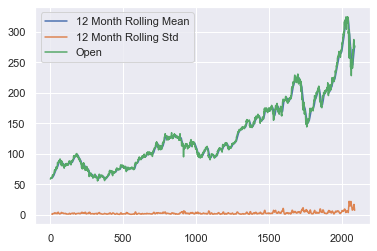

<Figure size 432x288 with 0 Axes>

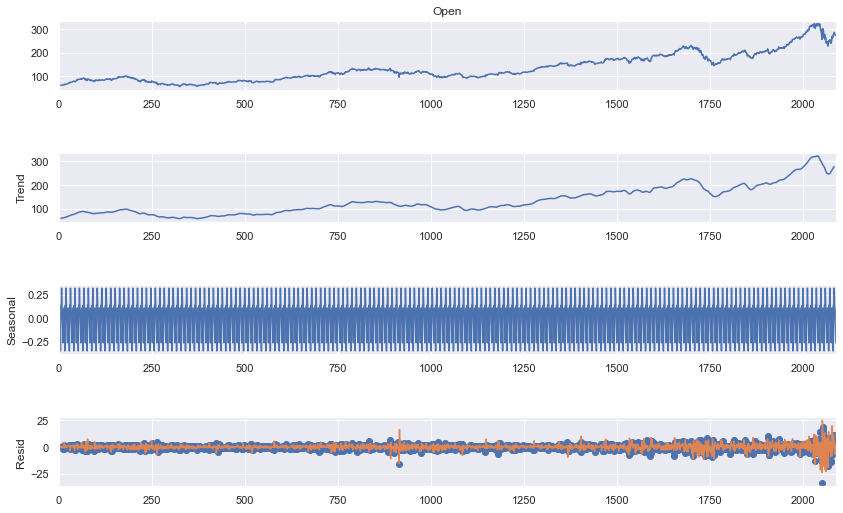

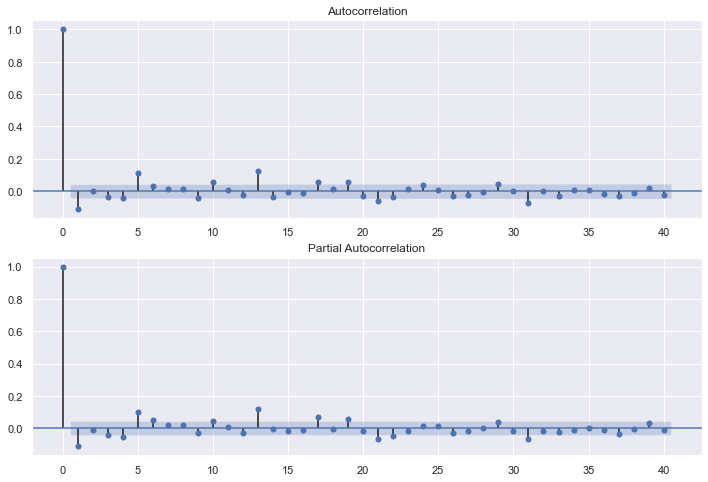

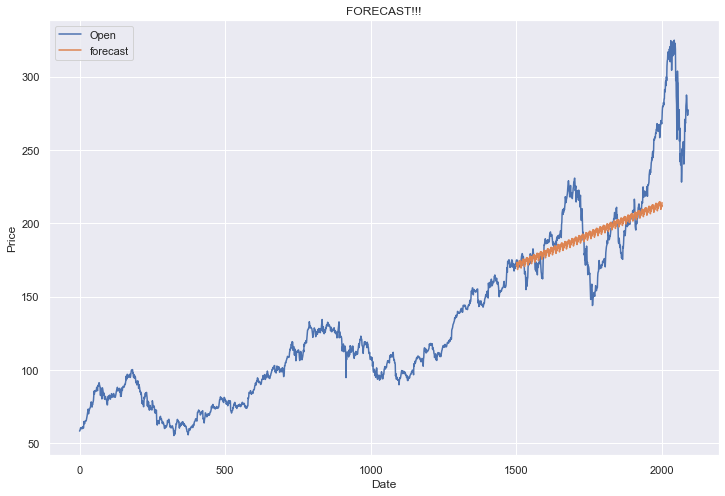

In [4]:
import numpy as np
import pandas as pd
import pandas_datareader as pdr
import statsmodels.api as sm
import datetime as datetime
import matplotlib.pyplot as plt
%matplotlib inline

TICKER = input('Enter Ticker: ')

df1=pdr.DataReader(TICKER, data_source='yahoo',start='2012-1-3')
df1.to_csv(r'C:/Users/gordon/OneDrive/CODE/4_Data/1_AssetAnalysis/TimeSeriesAnalysis.csv')
df = pd.read_csv(r'C:/Users/gordon/OneDrive/CODE/4_Data/1_AssetAnalysis/TimeSeriesAnalysis.csv')


df['Date1']=df['Date']
df.set_index('Date1')
timeseries = df['Open']


timeseries.rolling(12).mean().plot(label='12 Month Rolling Mean')
timeseries.rolling(12).std().plot(label='12 Month Rolling Std')
timeseries.plot()
plt.legend()


from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df['Open'], freq=12)  
fig = plt.figure()  
fig = decomposition.plot()  
fig.set_size_inches(13, 8)


from statsmodels.tsa.stattools import adfuller

# Store in a function for later use!
def adf_check(time_series):
    """
    Pass in a time series, returns ADF report
    """
    result = adfuller(time_series)
    print('Augmented Dickey-Fuller Test:')
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']

    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")
        
adf_check(df['Open'])

df['Open First Difference'] = df['Open'] - df['Open'].shift(1)

adf_check(df['Open First Difference'].dropna())

df['Open First Difference'].plot()
print('')

fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df['Open First Difference'].iloc[13:], lags=40, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df['Open First Difference'].iloc[13:], lags=40, ax=ax2)


model = sm.tsa.statespace.SARIMAX(df['Open'],order=(0,1,0), seasonal_order=(0,1,0,12))             
results = model.fit()          
print(results.summary())


df['forecast'] = results.predict(start = 1500, end= 2000, dynamic= True) 
df[['Open','forecast']].plot(figsize=(12,8))

plt.title('FORECAST!!!')
plt.ylabel('Price')
plt.xlabel('Date')

# BUY & SELL ORDER GENERATION:

Ticker: AAPL


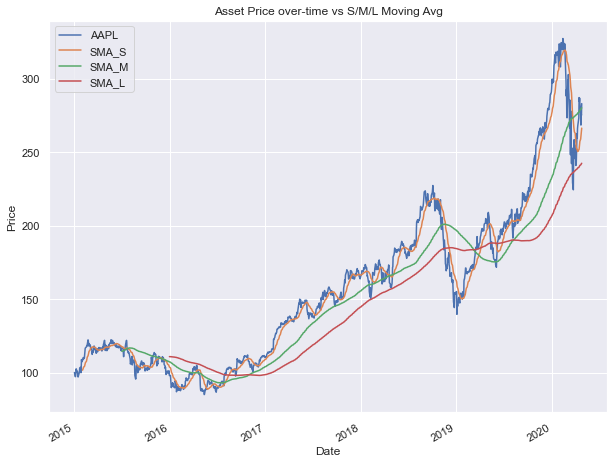

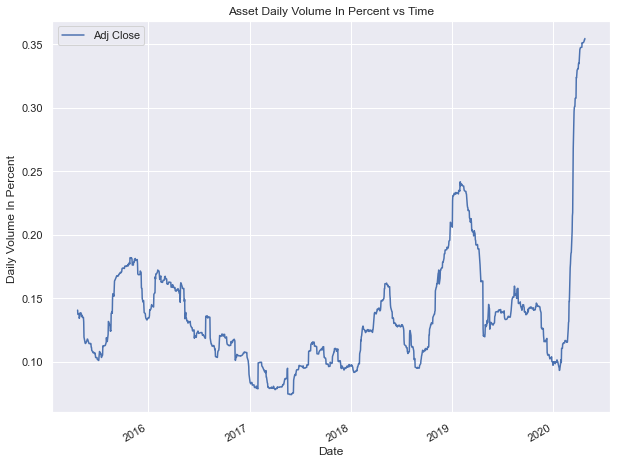

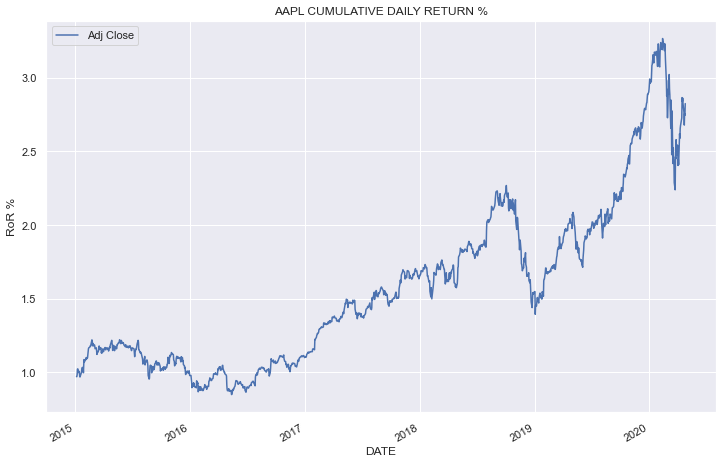

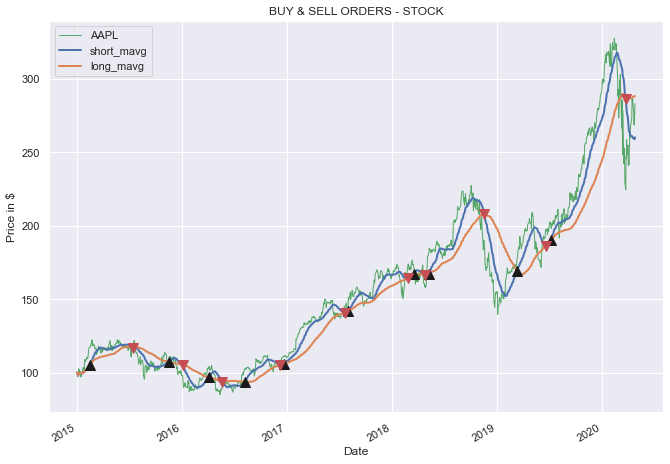

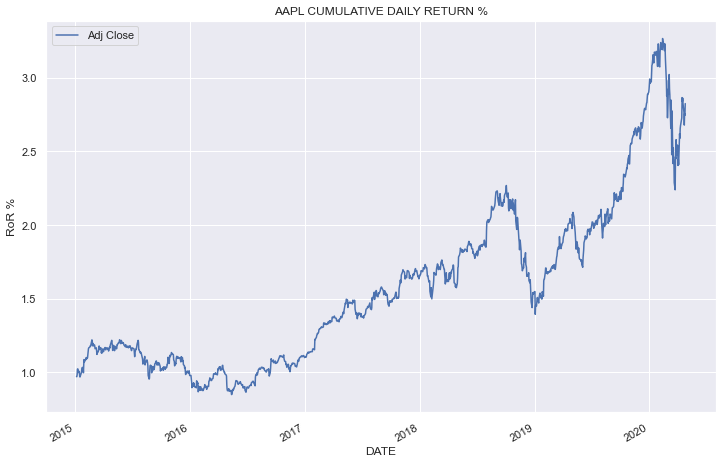

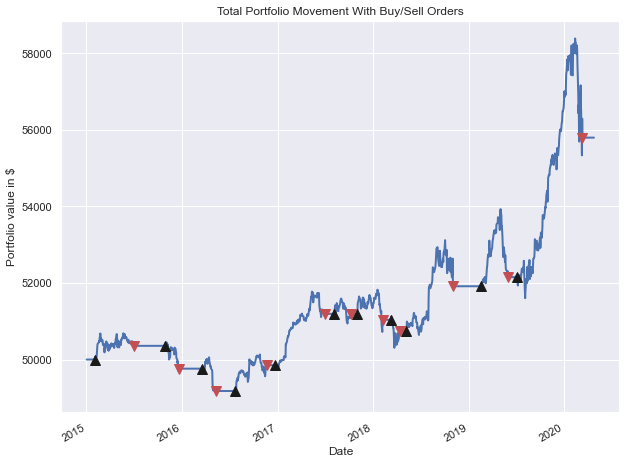

The Sharpe Ratio of AAPL = 58.55%



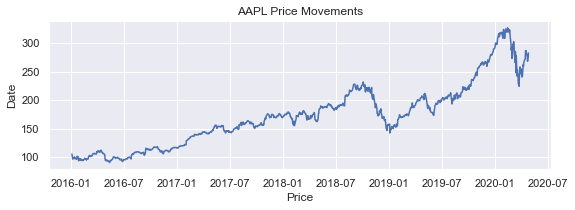

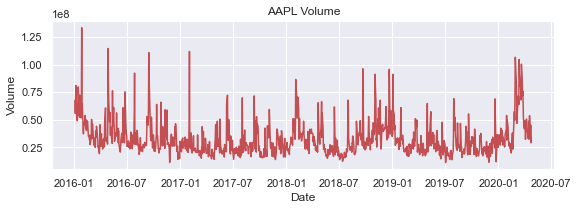

,Close,Volume
Date,,
2020-04-20,276.929993,32503800.0
2020-04-21,268.369995,45247900.0
2020-04-22,276.100006,29264300.0
2020-04-23,275.029999,31203600.0
2020-04-24,282.970001,31540300.0


In [5]:
######################### BUY & SELL ORDER GENERATION:
############## Build df Columns for SMA & LMA
import quandl
import yfinance as yf
from yahoofinancials import YahooFinancials
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import datetime as datetime
import pandas as pd
import pandas_datareader as pdr


ticker=input('Ticker: ')

start = datetime.datetime(2015,1,1)
end = datetime.date.today()

amzn = pdr.get_data_yahoo(ticker, start=start, end=end)
amzn.drop(['High','Low','Open','Close','Volume'], axis=1, inplace=True)
#amzn.head()


### Ratio Analysis
amzn_daily_close = amzn[['Adj Close']]
amzn_daily_pct_c = amzn_daily_close.pct_change()
amzn_daily_pct_c.fillna(0, inplace=True)

amzn_daily_pct_c = amzn_daily_close / amzn_daily_close.shift(1) - 1
amzn['Daily_S_RoR']=amzn_daily_pct_c['Adj Close']


### LOG Rate Of Return
amzn_daily_log_returns = np.log(amzn_daily_close.pct_change()+1)
amzn_daily_log_returns.head()
amzn['Daily_Log']=amzn_daily_log_returns['Adj Close']


### Monthly Return
monthly = amzn.resample('BM').apply(lambda x: x[-1])
#amzn['Monthly_RoR']=monthly['Adj Close']


### Quarterly Return
quarter = amzn.resample("4M").mean()
#amzn['Quarter_RoR']=quarter['Adj Close']


### Total Return
amzn_cum_daily_return = (1 + amzn_daily_pct_c).cumprod()
amzn['Total_RoR']=amzn_cum_daily_return['Adj Close']
amzn.rename(columns={'Adj Close': ticker}, inplace=True)


amzn_cum_monthly_return = amzn_cum_daily_return.resample("M").mean()
#amzn_cum_monthly_return

adj_close_px = amzn[ticker]
moving_avg = adj_close_px.rolling(window=40).mean()
#moving_avg[-10:]


amzn['SMA_S'] = adj_close_px.rolling(window=21).mean()
amzn['SMA_M'] = adj_close_px.rolling(window=126).mean()
amzn['SMA_L'] = adj_close_px.rolling(window=252).mean()

amzn[[ticker, 'SMA_S', 'SMA_M', 'SMA_L']].plot(figsize=(10, 8))
plt.ylabel('Price')
plt.title('Asset Price over-time vs S/M/L Moving Avg')

min_periods = 75 
vol = amzn_daily_pct_c.rolling(min_periods).std() * np.sqrt(min_periods) 
vol.plot(figsize=(10, 8))
plt.ylabel('Daily Volume In Percent ')
plt.title('Asset Daily Volume In Percent vs Time')

amzn_cum_daily_return.plot(figsize=(12,8))
plt.title(str(ticker)+' CUMULATIVE DAILY RETURN %')
plt.xlabel('DATE')
plt.ylabel('RoR %')

plt.show()
amzn.tail()

############################################################### Build df Columns for SMA & LMA
short_window = 30
long_window = 90
signals = pd.DataFrame(index=amzn.index)
signals['signal'] = 0.0
signals['short_mavg'] = amzn[ticker].rolling(window=short_window,
                                              min_periods=1, 
                                              center=False).mean()
signals['long_mavg'] = amzn[ticker].rolling(window=long_window, 
                                             min_periods=1, 
                                             center=False).mean()
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 
                                            1.0, 0.0) 
signals['positions'] = signals['signal'].diff()


### SIGNALS
signals=signals.replace({'signal': {1.0: 'Buy', 0.0: 'Sell'}})
signals['count']=signals.loc[signals.signal == 'Buy', ['count']] = 1.0
signals['count']=signals.loc[signals.signal == 'Sell', ['count']] = -1.0


### .............
fig = plt.figure(figsize=(11, 8))
ax1 = fig.add_subplot(111,  ylabel='Price in $')

amzn[ticker].plot(ax=ax1, color='g', lw=1)
signals[['short_mavg', 'long_mavg']].plot(ax=ax1, lw=2.)

ax1.plot(signals.loc[signals.positions == 1.0].index, 
         signals.short_mavg[signals.positions == 1.0],
         '^', markersize=10, color='k')
         
ax1.plot(signals.loc[signals.positions == -1.0].index, 
         signals.short_mavg[signals.positions == -1.0],
         'v', markersize=10, color='r')

plt.title('BUY & SELL ORDERS - STOCK')
plt.legend()
plt.show()

signals.tail()

######################################################## Evaluate Short Moving Average(SMA) vs Long Moving Average
short_window = 21
long_window = 63
signals = pd.DataFrame(index=amzn.index)
signals['signal'] = 0.0
signals['short_mavg'] = amzn[ticker].rolling(window=short_window, min_periods=1, center=False).mean()
signals['long_mavg'] = amzn[ticker].rolling(window=long_window, min_periods=1, center=False).mean()
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 1.0, 0.0) 
signals['positions'] = signals['signal'].diff()


## Set Portfolio 
initial_capital= float(50000.0)
positions = pd.DataFrame(index=signals.index).fillna(0.0)
positions['stock'] = 50*signals['signal']   
portfolio = positions.multiply(amzn[ticker], axis=0)
pos_diff = positions.diff()
portfolio['holdings'] = (positions.multiply(amzn[ticker],
                                            axis=0)).sum(axis=1)
portfolio['cash'] = initial_capital -(pos_diff.multiply(amzn[ticker],
                                                        axis=0)).sum(axis=1).cumsum()
portfolio['total'] = portfolio['cash'] + portfolio['holdings']
portfolio['returns'] = portfolio['total'].pct_change()


### SHARPE RATIO
returns = portfolio['returns']
portfolio_ror=np.sqrt(252) * (returns.mean() / returns.std())


### CONSTRUCT ORDERS
amzn_cum_daily_return.plot(figsize=(12,8))
plt.title(str(ticker)+' CUMULATIVE DAILY RETURN %')
plt.xlabel('DATE')
plt.ylabel('RoR %')

fig = plt.figure(figsize=(10, 8))
ax1 = fig.add_subplot(111, ylabel='Portfolio value in $')
portfolio['total'].plot(ax=ax1, lw=2.)

ax1.plot(portfolio.loc[signals.positions == 1.0].index, 
         portfolio.total[signals.positions == 1.0],
         '^', markersize=10, color='k')

ax1.plot(portfolio.loc[signals.positions == -1.0].index, 
         portfolio.total[signals.positions == -1.0],
         'v', markersize=10, color='r')

plt.title('Total Portfolio Movement With Buy/Sell Orders')
plt.show()

print ("The Sharpe Ratio of "+ticker+" = "+"{0:.2%}".format(portfolio_ror))
print('')
portfolio.tail()


############################################################ Demo
import quandl
import yfinance as yf
from yahoofinancials import YahooFinancials
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import pandas_datareader as pdr


### ............
ticker=ticker
start = datetime.datetime(2016,1,1)
end = datetime.date.today()

amzn = pdr.get_data_yahoo(ticker, 
                          start=start,
                          end=end)
amzn.drop(['High','Low','Open','Adj Close'],
          axis=1, inplace=True)


### ...........
fig = plt.figure(figsize=(9,6))
plt.subplot(211)
plt.plot(amzn['Close'])
plt.title(str(ticker)+' Price Movements')
plt.ylabel('Date')
plt.xlabel('Price')
plt.show()

fig = plt.figure(figsize=(9,6))
plt.subplot(212)
plt.plot(amzn['Volume'], color='r')
plt.title(str(ticker)+' Volume')
plt.ylabel('Volume')
plt.xlabel('Date')

plt.show()
amzn.tail()



# Monte Carlo simulations in finance

##### Simulating stock price dynamics using Geometric Brownian Motion

##### How to do it...
1. Import libraries
2. Define parameters for downloading data
3. Download data from Yahoo Finance:
4. Calculate daily returns:
5. Split data into the training and test sets:
6. Specify the parameters of the simulation:
7. Define the function used for simulations:
8. Run the simulations:
9. Plot simulation results:

Enter Asset: AAPL
[*********************100%***********************]  1 of 1 completed
Downloaded 306 rows of data.


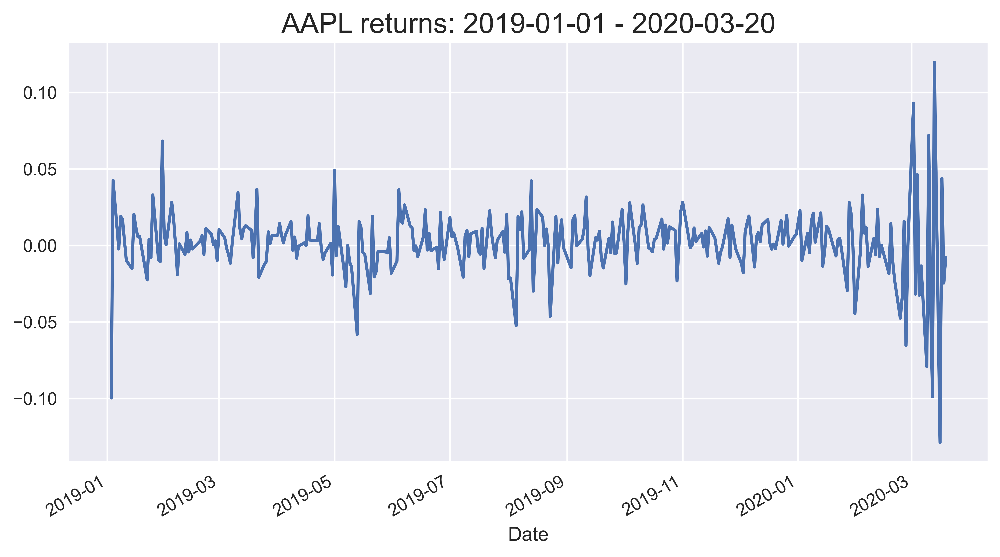

Average return: 0.18%


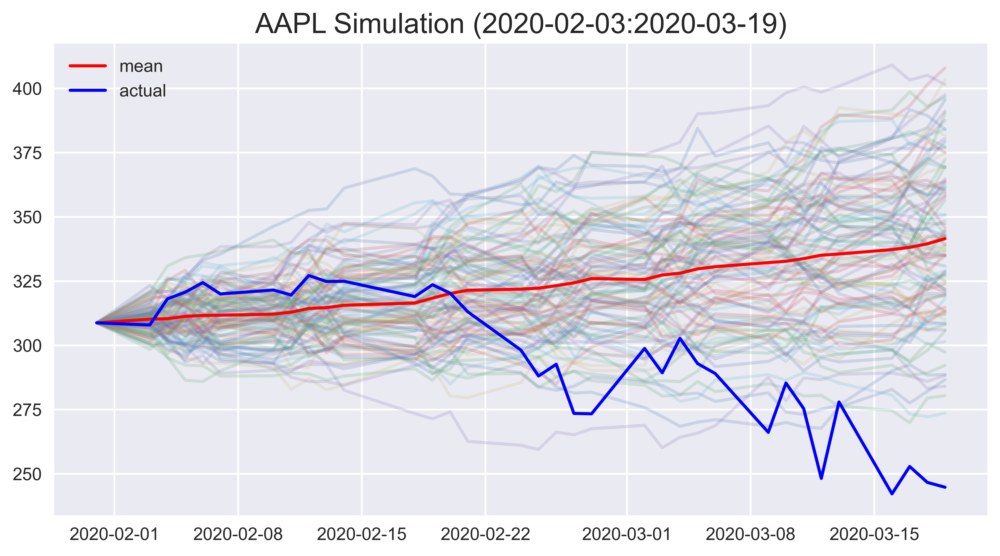

In [3]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
import warnings
plt.style.use('seaborn')
# plt.style.use('seaborn-colorblind') #alternative
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)
import numpy as np
import pandas as pd
import yfinance as yf


### 2. Define parameters for downloading data:
RISKY_ASSET = input('Enter Asset: ')
START_DATE = '2019-01-01'
END_DATE = '2020-4-24'


### 3. Download data from Yahoo Finance:
df = yf.download(RISKY_ASSET, start=START_DATE, 
                 end=END_DATE, adjusted=True)
print(f'Downloaded {df.shape[0]} rows of data.')


### 4. Calculate daily returns:
adj_close = df['Adj Close']
returns = adj_close.pct_change().dropna()

ax = returns.plot()
ax.set_title(f'{RISKY_ASSET} returns: {START_DATE} - {END_DATE}', 
             fontsize=16)

plt.tight_layout()
plt.savefig(r'C:/Users/gordon/OneDrive/CODE/4_Data/1_AssetAnalysis/MonteCarloSim.png')
plt.show()

print(f'Average return: {100 * returns.mean():.2f}%')


### 5. Split data into the training and test sets:
train = returns['2019-01-01':'2020-01-31']
test = returns['2020-02-01':'2030-03-20']


### 6. Specify the parameters of the simulation:
T = len(test)
N = len(test)
S_0 = adj_close[train.index[-1].date()]
N_SIM = 100
mu = train.mean()
sigma = train.std()



### 7. Define the function used for simulations:
def simulate_gbm(s_0, mu, sigma, n_sims, T, N, 
                 random_seed=42):
    '''
    Function used for simulating stock returns using Geometric Brownian Motion.
    
    Parameters
    ------------
    s_0 : float
        Initial stock price
    mu : float
        Drift coefficient
    sigma : float
        Diffusion coefficient
    n_sims : int
        Number of simulations paths
    dt : float
        Time increment, most commonly a day
    T : float
        Length of the forecast horizon, same unit as dt
    N : int
        Number of time increments in the forecast horizon
    random_seed : int
        Random seed for reproducibility

    Returns
    -----------
    S_t : np.ndarray
        Matrix (size: n_sims x (T+1)) containing the simulation results. 
        Rows respresent sample paths, while columns point of time.
    '''
    np.random.seed(random_seed)
    
    dt = T/N
    dW = np.random.normal(scale = np.sqrt(dt), size=(n_sims, N))
    W = np.cumsum(dW, axis=1)
    
    time_step = np.linspace(dt, T, N)
    time_steps = np.broadcast_to(time_step, (n_sims, N))
    
    S_t = s_0 * np.exp((mu - 0.5 * sigma**2) * time_steps 
                       + sigma * W)
    S_t = np.insert(S_t, 0, s_0, axis=1)
    
    return S_t


### 8. Run the simulations:
gbm_simulations = simulate_gbm(S_0, mu, sigma, N_SIM, T, N)


### 9. Plot simulation results:
# prepare objects for plotting 
last_train_date = train.index[-1].date()
first_test_date = test.index[0].date()
last_test_date = test.index[-1].date()
plot_title = (f'{RISKY_ASSET} Simulation '
              f'({first_test_date}:{last_test_date})')

selected_indices = adj_close[last_train_date:last_test_date].index
index = [date.date() for date in selected_indices]

gbm_simulations_df = pd.DataFrame(np.transpose(gbm_simulations), 
                                  index=index)

# plotting
ax = gbm_simulations_df.plot(alpha=0.2, legend=False)
line_1, = ax.plot(index, gbm_simulations_df.mean(axis=1), 
                  color='red')
line_2, = ax.plot(index, adj_close[last_train_date:last_test_date], 
                  color='blue')
ax.set_title(plot_title, fontsize=16)
ax.legend((line_1, line_2), ('mean', 'actual'))

plt.tight_layout()
plt.savefig(r'C:/Users/gordon/OneDrive/CODE/4_Data/1_AssetAnalysis/MonteCarloSim.png')
plt.show()

# Visualization and Analysis
* After you have the stock market data, the next step is to create trading strategies and analyze the performance.

* I have created a simple buy and hold strategy for illustration purpose with four stocks namely Apple, Amazon, Microsoft and Walmart.

* To analyze the performance, you can use the pyfolio tear sheet as shown below.

Enter Tickers: AAPL
[*********************100%***********************]  1 of 1 completed


Start date,2015-04-28
End date,2020-04-24
Total months,59
,Backtest
Annual return,18.342%
Cumulative returns,131.805%
Annual volatility,28.742%
Sharpe ratio,0.73
Calmar ratio,0.48
Stability,0.85
Max drawdown,-38.516%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,38.52,2018-10-03,2019-01-03,2019-10-10,267
1,31.43,2020-02-12,2020-03-23,NaT,NaN
2,30.44,2015-05-22,2016-05-12,2017-02-01,444
3,13.45,2018-01-18,2018-02-08,2018-02-26,28
4,10.68,2018-03-12,2018-04-27,2018-05-04,40


Stress Events,mean,min,max
Fall2015,-0.13%,-6.12%,5.74%
New Normal,0.08%,-12.86%,11.98%


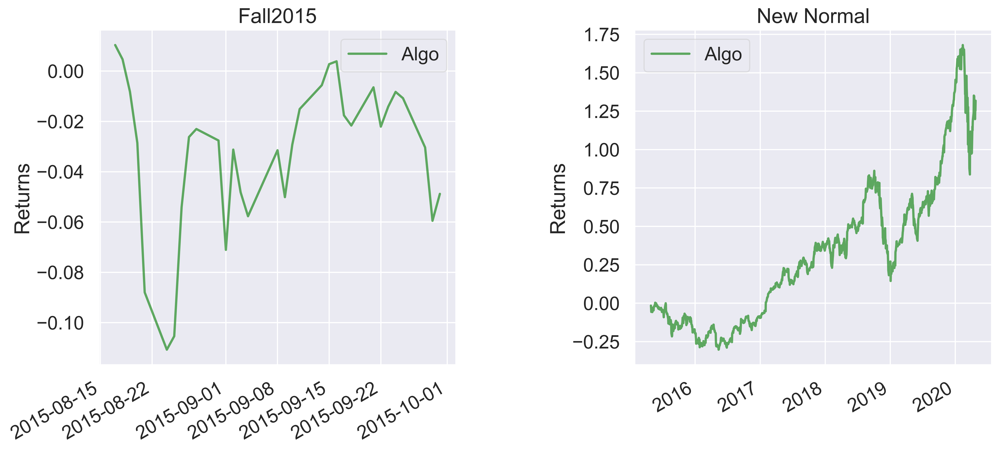

In [4]:
import pyfolio as pf
import pandas as pd
import numpy as np
import yfinance as yf


############################### Define the ticker list
#tickers_list = ['AMZN']
tickers_list=[input('Enter Tickers: ')]

################################ Import pandas and create a placeholder for the data
data = pd.DataFrame(columns=tickers_list)

# Feth the data
for ticker in tickers_list:
    data[ticker] = yf.download(ticker, period='5y',)['Adj Close']

######## Compute the returns of individual stocks and then compute the daily mean returns.
####### The mean return is the daily portfolio returns with the above four stocks.

data = data.pct_change().dropna().mean(axis=1)
data.idxmin(axis=1)

pf.create_full_tear_sheet(data)